In [20]:
import os
import base64
from PIL import Image
import pandas as pd
from IPython.display import HTML, display

def image_formatter(path):
    with open(path, "rb") as image_file:
        encoded_image = base64.b64encode(image_file.read()).decode('utf-8')
    return f'<img src="data:image/png;base64,{encoded_image}" width="100">'

def process_images(folder_path):
    image_data = []

    if not os.path.exists(folder_path):
        print(f"Папка {folder_path} не знайдена.")
        return None

    file_list = os.listdir(folder_path)

    for file_name in file_list:
        file_path = os.path.join(folder_path, file_name)

        try:
            img = Image.open(file_path)
        except (IOError, SyntaxError):
            continue

        image_info = {
            'name': file_name,
            'color model': img.mode,
            'format': img.format,
            'channels': len(img.getbands()),
            'size (MB)': round(os.path.getsize(file_path) / (1024 ** 2), 2),
            'width': img.width,
            'height': img.height,
            'full path': file_path,
            'image': file_path
        }

        image_data.append(image_info)

    df = pd.DataFrame(image_data)

    return df

def to_dataframe(folder_path):
    df = process_images(folder_path)
    
    if df is not None:
        return df

,name,color model,format,channels,size (MB),width,height,full path,image
0,1.png,RGBA,PNG,4,1.07,564,846,D:\stud\pyt 5\Lab4\photos\1.png,
1,10.png,RGB,PNG,3,0.30,564,564,D:\stud\pyt 5\Lab4\photos\10.png,
2,11.webp,RGB,WEBP,3,0.13,1600,1956,D:\stud\pyt 5\Lab4\photos\11.webp,
3,12.jpg,RGB,JPEG,3,0.13,640,840,D:\stud\pyt 5\Lab4\photos\12.jpg,
4,13.png,RGBA,PNG,4,1.31,2560,1440,D:\stud\pyt 5\Lab4\photos\13.png,
5,14.jpeg,RGB,JPEG,3,0.12,1138,1280,D:\stud\pyt 5\Lab4\photos\14.jpeg,
6,15.png,RGBA,PNG,4,6.68,3840,2400,D:\stud\pyt 5\Lab4\photos\15.png,
7,2.jfif,RGB,JPEG,3,0.46,4096,2304,D:\stud\pyt 5\Lab4\photos\2.jfif,
8,3.jpg,RGB,JPEG,3,0.11,564,793,D:\stud\pyt 5\Lab4\photos\3.jpg,
9,4.png,RGB,PNG,3,0.36,564,607,D:\stud\pyt 5\Lab4\photos\4.png,

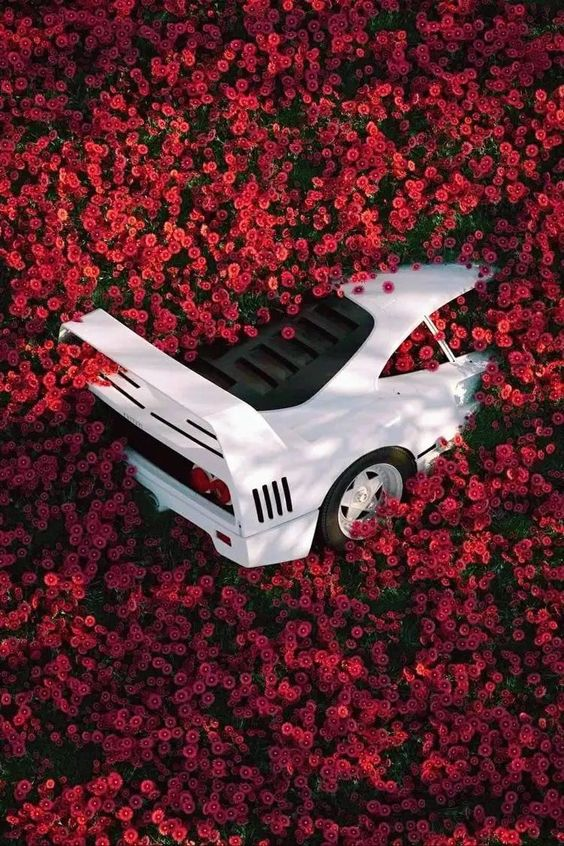
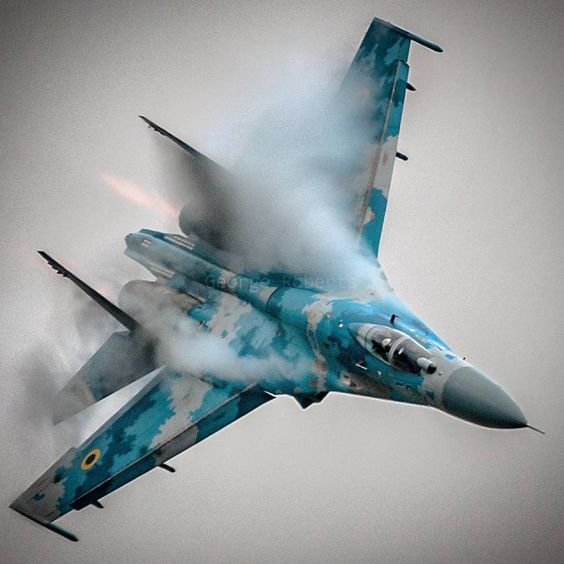
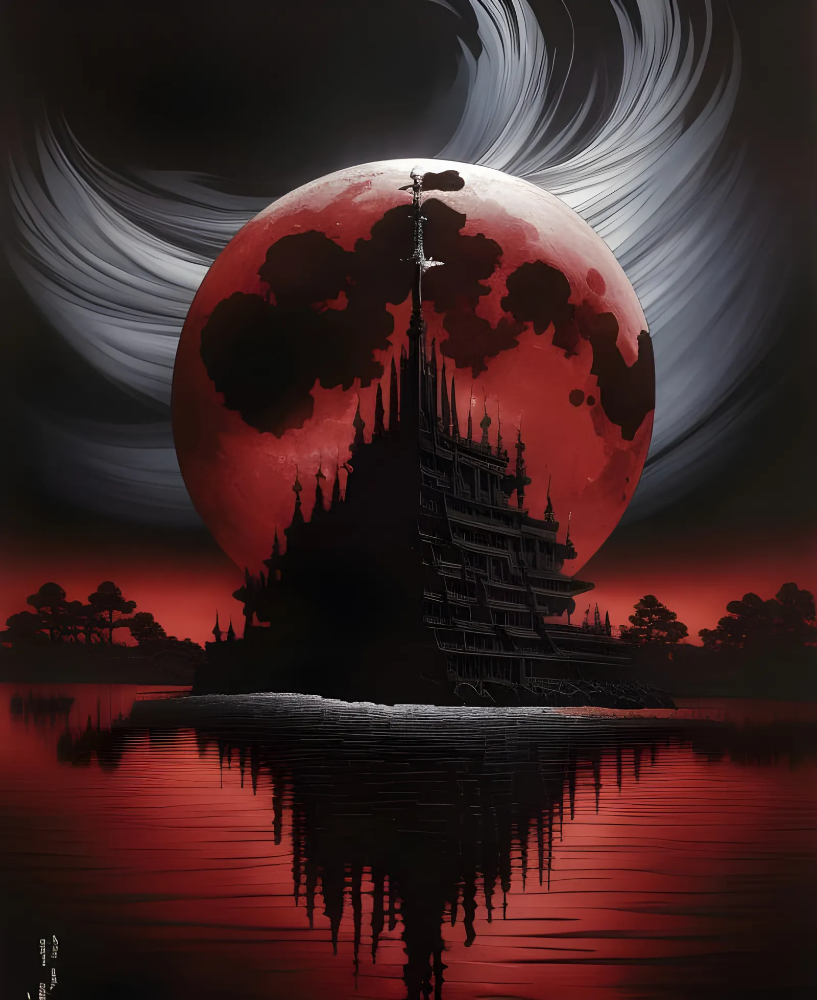
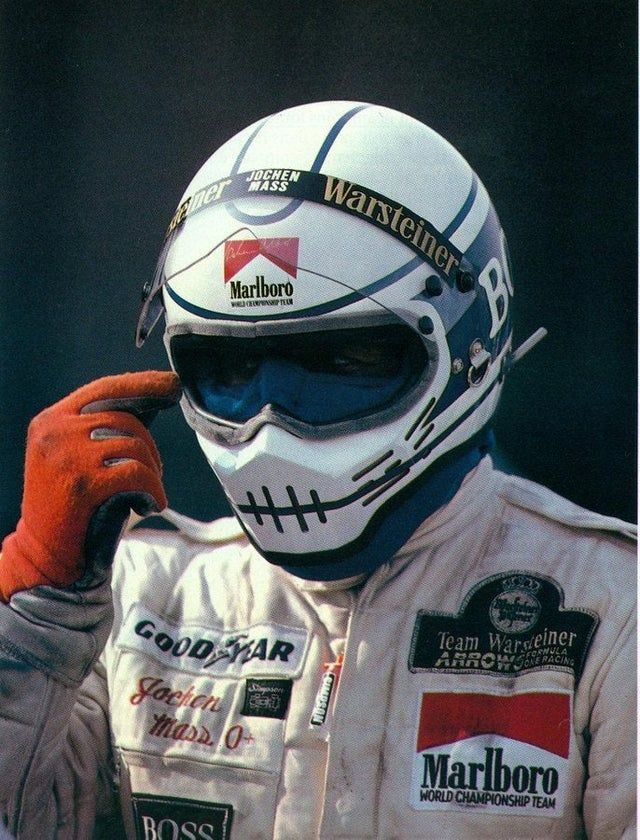
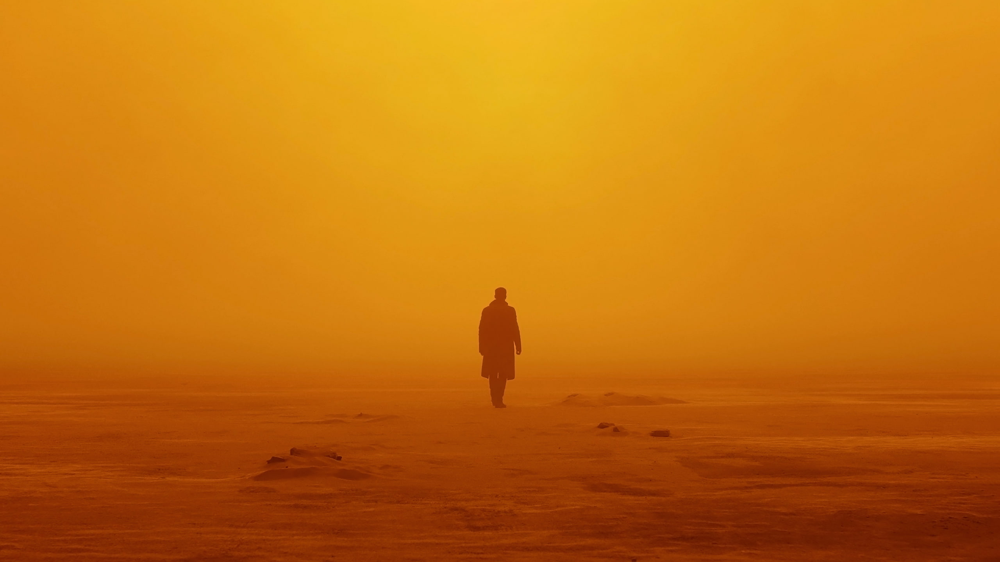
...
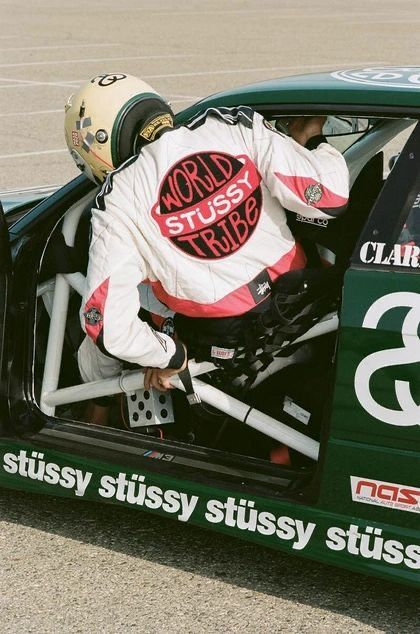
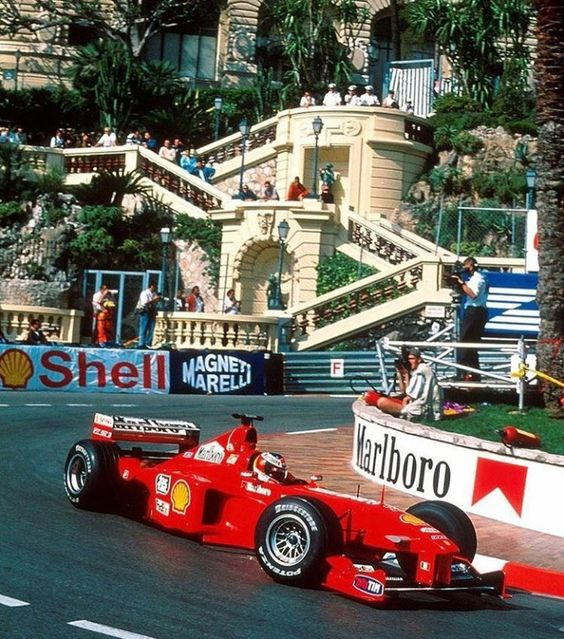
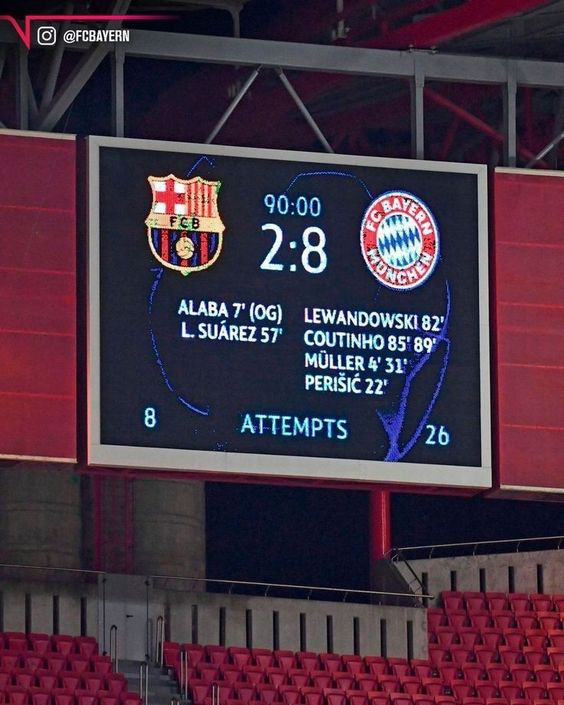
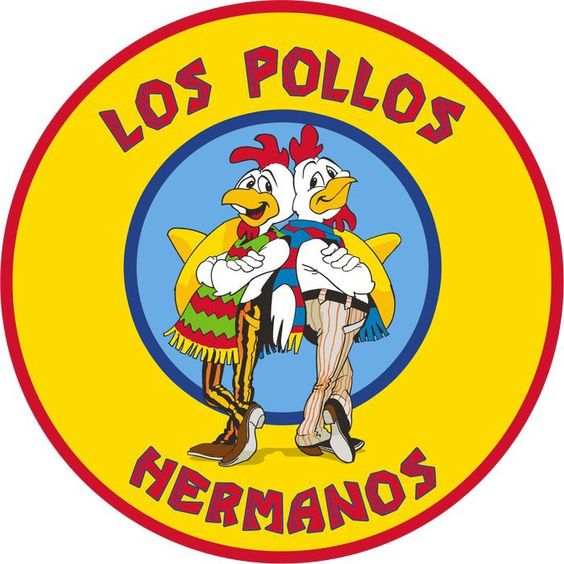
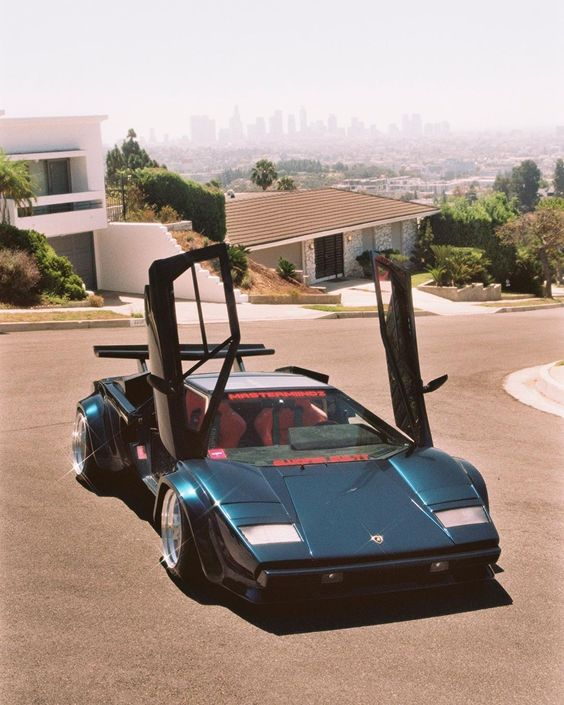

In [21]:
folder_path = r'D:\stud\pyt 5\Lab4\photos'
dff = to_dataframe(folder_path)
HTML(dff.to_html(formatters={'image': image_formatter}, escape=False))

In [11]:
# from PIL import Image

# image = Image.open('15.jpg')
# image = image.convert('RGBA')
# image.save('15.png')